In [13]:
# from google.colab import drive
# drive.mount('/content/drive')
# import os
# os.chdir("/content/drive/MyDrive/Colab Notebooks/HW3-CNN")  # full path to your folder
# import hw3  # check correctness

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 3: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [14]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
# Make sure you are using GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(torch.__version__)
print('Using device:', device)

2.0.1+cu118
Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

We'll use the same data as in Part 2.

Let's begin by downloading a dataset of images that we want to learn to generate.
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labels faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

In [16]:
import helpers.plot as plot
import helpers.download

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'

_, dataset_dir = helpers.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /root/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /root/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /root/.pytorch-datasets/lfw/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [17]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


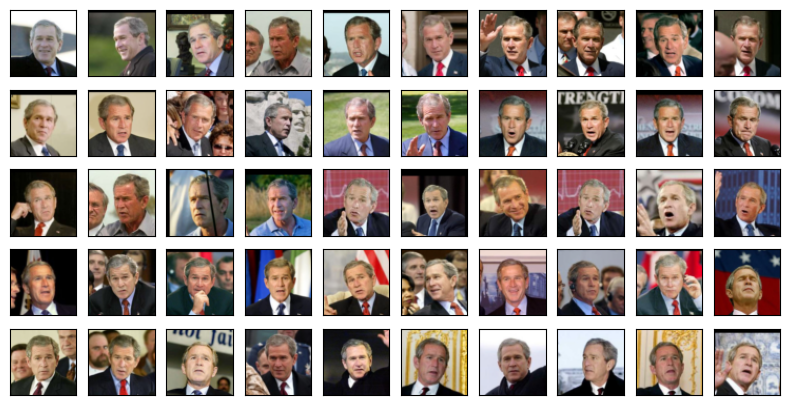

In [18]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(10,5), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [19]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the loss with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [20]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [21]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [22]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)

tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [23]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

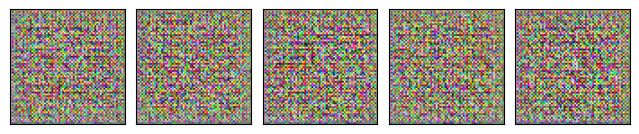

In [24]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparam()` function within the `hw3/answers.py` module.

In [25]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 16, 'z_dim': 128, 'data_label': 1, 'label_noise': 0.2, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}}


**TODO**:
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training.

--- EPOCH 1/100 ---
100%|██████████| 34/34 [00:03<00:00,  9.63it/s]
Discriminator loss: 0.20827021367628784
Generator loss:     8.612300164559308


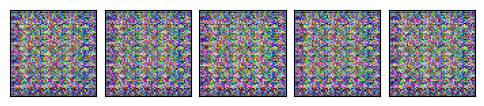

--- EPOCH 2/100 ---
100%|██████████| 34/34 [00:03<00:00,  9.96it/s]
Discriminator loss: 0.2973007843555773
Generator loss:     14.629784023060518


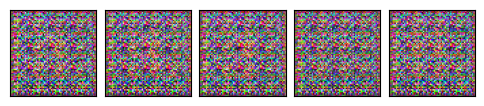

--- EPOCH 3/100 ---
100%|██████████| 34/34 [00:03<00:00,  9.74it/s]
Discriminator loss: 0.6117834649322664
Generator loss:     11.683521908872267


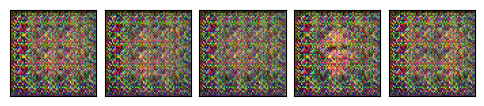

--- EPOCH 4/100 ---
100%|██████████| 34/34 [00:01<00:00, 18.03it/s]
Discriminator loss: 0.5412993455743965
Generator loss:     9.376431072459502


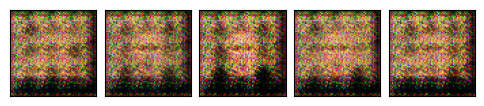

--- EPOCH 5/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.62it/s]
Discriminator loss: 0.7836488586138276
Generator loss:     6.4914657859241265


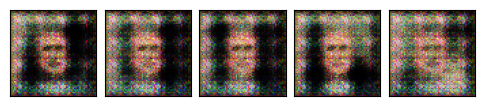

--- EPOCH 6/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.02it/s]
Discriminator loss: 0.602910013321568
Generator loss:     4.88541838351418


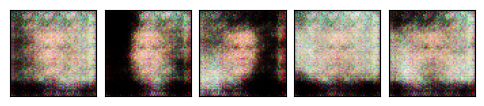

--- EPOCH 7/100 ---
100%|██████████| 34/34 [00:01<00:00, 17.65it/s]
Discriminator loss: 0.7508678646648631
Generator loss:     3.4236168335465824


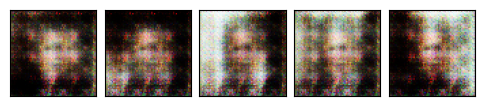

--- EPOCH 8/100 ---
100%|██████████| 34/34 [00:01<00:00, 17.49it/s]
Discriminator loss: 0.5772559802760097
Generator loss:     4.295229599756353


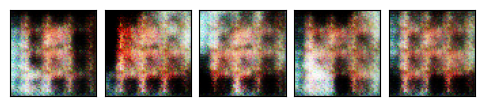

--- EPOCH 9/100 ---
100%|██████████| 34/34 [00:01<00:00, 17.22it/s]
Discriminator loss: 0.6725220884579945
Generator loss:     4.365894815501044


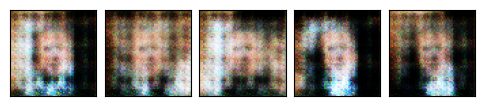

--- EPOCH 10/100 ---
100%|██████████| 34/34 [00:01<00:00, 17.26it/s]
Discriminator loss: 0.5252394380376619
Generator loss:     4.656857167973238


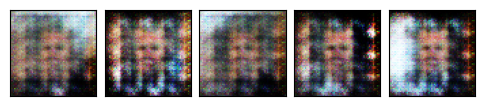

--- EPOCH 11/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.47it/s]
Discriminator loss: 0.7517512905247071
Generator loss:     4.101963509531582


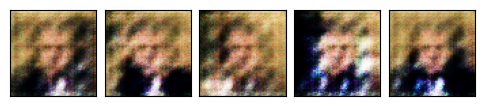

--- EPOCH 12/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.52it/s]
Discriminator loss: 0.6685367884004817
Generator loss:     4.117112349061405


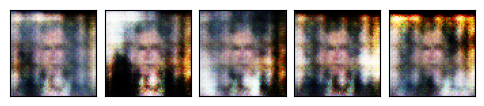

--- EPOCH 13/100 ---
100%|██████████| 34/34 [00:01<00:00, 17.17it/s]
Discriminator loss: 0.6606998881872963
Generator loss:     4.036470676169676


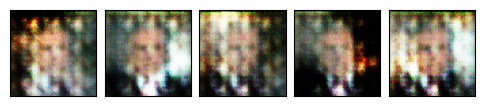

--- EPOCH 14/100 ---
100%|██████████| 34/34 [00:02<00:00, 16.81it/s]
Discriminator loss: 0.5647623039343778
Generator loss:     3.8290827993084404


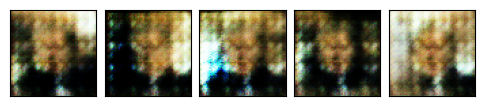

--- EPOCH 15/100 ---
100%|██████████| 34/34 [00:01<00:00, 17.10it/s]
Discriminator loss: 0.5840706592973541
Generator loss:     4.364264312912436


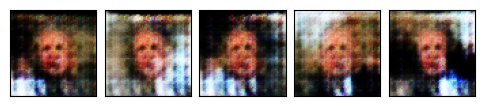

--- EPOCH 16/100 ---
100%|██████████| 34/34 [00:02<00:00, 16.85it/s]
Discriminator loss: 0.5209485007559552
Generator loss:     4.189490598790786


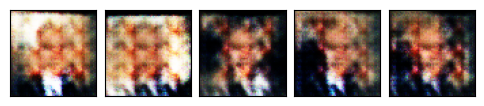

--- EPOCH 17/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.56it/s]
Discriminator loss: 0.581069598083987
Generator loss:     4.5030735801247985


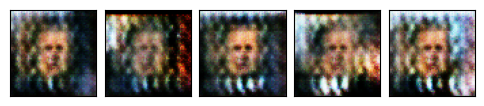

--- EPOCH 18/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.02it/s]
Discriminator loss: 0.5858542461167363
Generator loss:     4.542989734341116


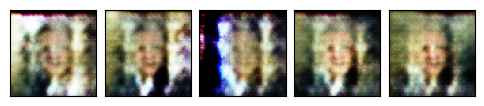

--- EPOCH 19/100 ---
100%|██████████| 34/34 [00:02<00:00, 16.30it/s]
Discriminator loss: 0.6335217602112714
Generator loss:     4.2180701143601365


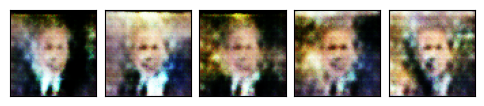

--- EPOCH 20/100 ---
100%|██████████| 34/34 [00:02<00:00, 16.60it/s]
Discriminator loss: 0.5542194654836374
Generator loss:     3.733742289683398


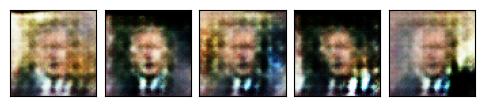

--- EPOCH 21/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.55it/s]
Discriminator loss: 0.5613498924409642
Generator loss:     4.194483904277577


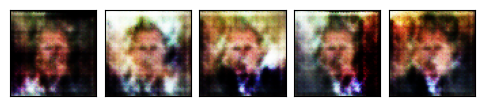

--- EPOCH 22/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.77it/s]
Discriminator loss: 0.6176741311655325
Generator loss:     3.9679555577390335


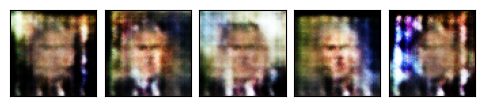

--- EPOCH 23/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.99it/s]
Discriminator loss: 0.624397132983979
Generator loss:     4.247010160894955


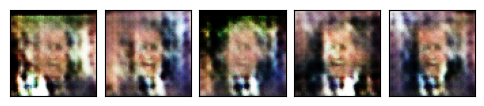

--- EPOCH 24/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.38it/s]
Discriminator loss: 0.5440785060910618
Generator loss:     4.409536424805136


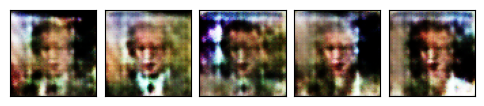

--- EPOCH 25/100 ---
100%|██████████| 34/34 [00:02<00:00, 16.30it/s]
Discriminator loss: 0.48620496536878977
Generator loss:     4.23594453755547


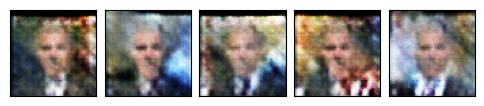

--- EPOCH 26/100 ---
100%|██████████| 34/34 [00:02<00:00, 16.15it/s]
Discriminator loss: 0.4998367290724726
Generator loss:     4.498521327972412


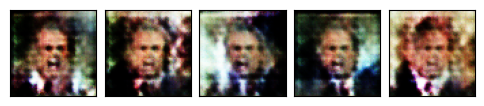

--- EPOCH 27/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.71it/s]
Discriminator loss: 0.7064130411428564
Generator loss:     4.5416498219265655


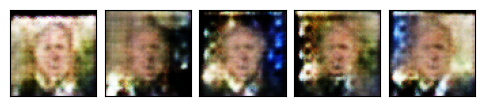

--- EPOCH 28/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.91it/s]
Discriminator loss: 0.5343931430183789
Generator loss:     4.2398114590083855


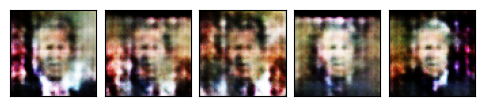

--- EPOCH 29/100 ---
100%|██████████| 34/34 [00:03<00:00, 11.26it/s]
Discriminator loss: 0.513339081669555
Generator loss:     4.084908720325021


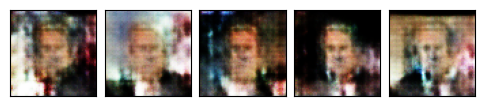

--- EPOCH 30/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.68it/s]
Discriminator loss: 0.43186066124369116
Generator loss:     4.242739039308884


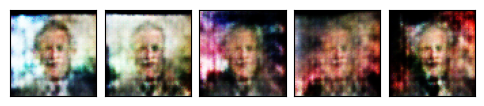

--- EPOCH 31/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.79it/s]
Discriminator loss: 0.7247788360451951
Generator loss:     4.226367308812983


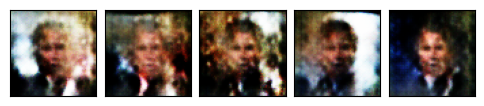

--- EPOCH 32/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.91it/s]
Discriminator loss: 0.5678527140442062
Generator loss:     3.977022654869977


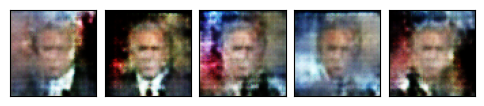

--- EPOCH 33/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.70it/s]
Discriminator loss: 0.6135975801769424
Generator loss:     4.133891841944526


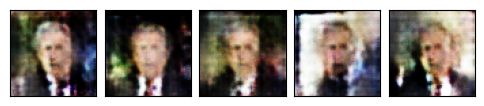

--- EPOCH 34/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.94it/s]
Discriminator loss: 0.6324563530438087
Generator loss:     4.076322292580324


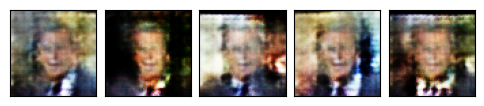

--- EPOCH 35/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.22it/s]
Discriminator loss: 0.4340757543549818
Generator loss:     3.8787221067092


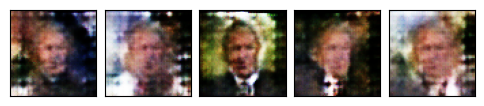

--- EPOCH 36/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.82it/s]
Discriminator loss: 0.5915675378021072
Generator loss:     4.356481969356537


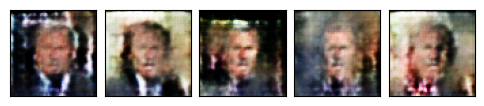

--- EPOCH 37/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.95it/s]
Discriminator loss: 0.5850032936124241
Generator loss:     3.97227705226225


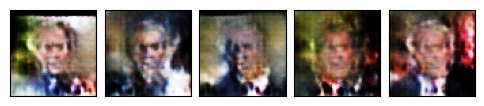

--- EPOCH 38/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.25it/s]
Discriminator loss: 0.4500527097021832
Generator loss:     3.922304269145517


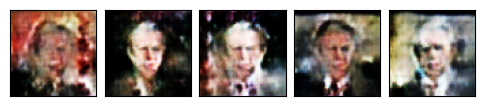

--- EPOCH 39/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.07it/s]
Discriminator loss: 0.43430155208882165
Generator loss:     4.282290129100575


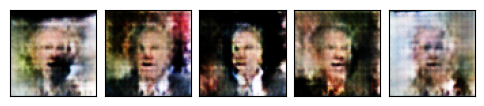

--- EPOCH 40/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.35it/s]
Discriminator loss: 0.47784708571784634
Generator loss:     4.299308755818536


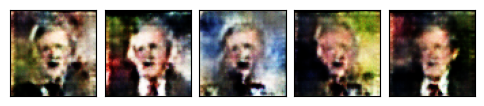

--- EPOCH 41/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.75it/s]
Discriminator loss: 0.5659021640963414
Generator loss:     4.039570152759552


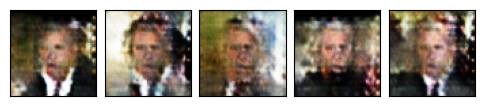

--- EPOCH 42/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.63it/s]
Discriminator loss: 0.4261697813430253
Generator loss:     4.043092310428619


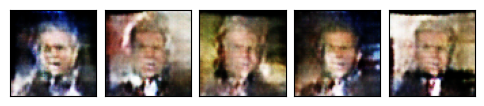

--- EPOCH 43/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.64it/s]
Discriminator loss: 0.5483308557201835
Generator loss:     4.562658131122589


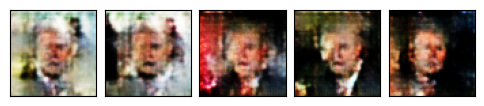

--- EPOCH 44/100 ---
100%|██████████| 34/34 [00:02<00:00, 15.57it/s]
Discriminator loss: 0.3272820542402127
Generator loss:     4.122704835499034


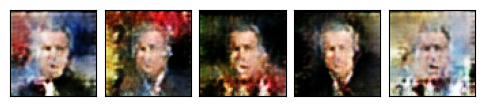

--- EPOCH 45/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.26it/s]
Discriminator loss: 0.4095983574276461
Generator loss:     4.479927713380141


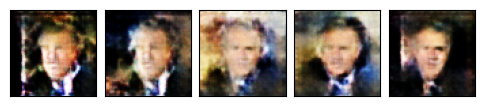

--- EPOCH 46/100 ---
100%|██████████| 34/34 [00:03<00:00, 10.60it/s]
Discriminator loss: 0.5239866393453935
Generator loss:     4.324856190120473


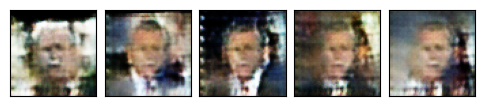

--- EPOCH 47/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.17it/s]
Discriminator loss: 0.3503010842730017
Generator loss:     4.285894555204055


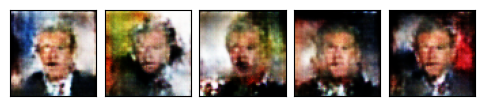

--- EPOCH 48/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.38it/s]
Discriminator loss: 0.33864961783675585
Generator loss:     4.293560792418087


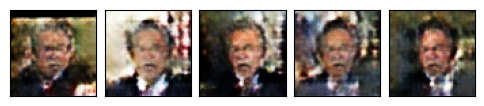

--- EPOCH 49/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.22it/s]
Discriminator loss: 0.3134487076826832
Generator loss:     4.511470237198998


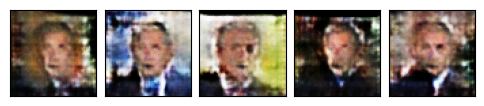

--- EPOCH 50/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.28it/s]
Discriminator loss: 0.5161633082829854
Generator loss:     4.847117413711898


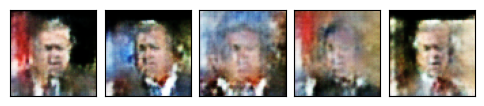

--- EPOCH 51/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.33it/s]
Discriminator loss: 0.5041694608243072
Generator loss:     4.216476365047343


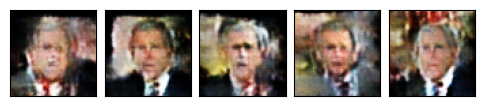

--- EPOCH 52/100 ---
100%|██████████| 34/34 [00:03<00:00, 10.41it/s]
Discriminator loss: 0.3354642481050071
Generator loss:     4.444743622751797


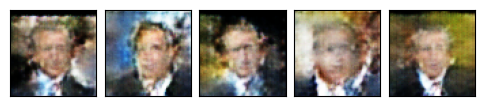

--- EPOCH 53/100 ---
100%|██████████| 34/34 [00:03<00:00,  9.95it/s]
Discriminator loss: 0.3358964276883532
Generator loss:     4.256049243842854


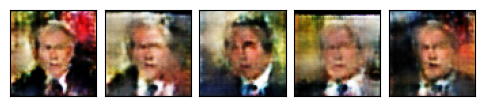

--- EPOCH 54/100 ---
100%|██████████| 34/34 [00:03<00:00, 11.31it/s]
Discriminator loss: 0.39130364895305214
Generator loss:     4.700236297705594


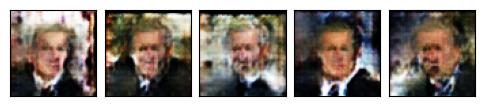

--- EPOCH 55/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.06it/s]
Discriminator loss: 0.5293930030482656
Generator loss:     4.465559600030675


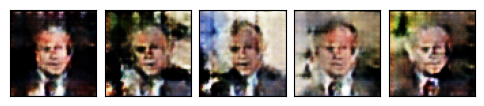

--- EPOCH 56/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.18it/s]
Discriminator loss: 0.4430091508171138
Generator loss:     4.620389650849735


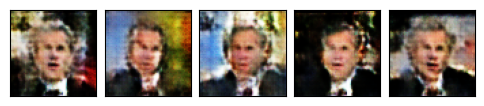

--- EPOCH 57/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.95it/s]
Discriminator loss: 0.376054345684893
Generator loss:     4.7922863469404335


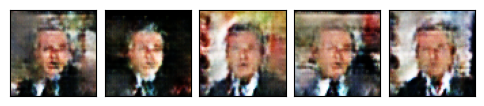

--- EPOCH 58/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.34it/s]
Discriminator loss: 0.3658836916198625
Generator loss:     4.5240729345994835


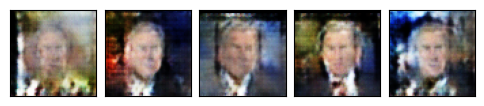

--- EPOCH 59/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.92it/s]
Discriminator loss: 0.34900650140993733
Generator loss:     4.338369937504039


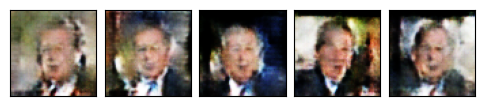

--- EPOCH 60/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.36it/s]
Discriminator loss: 0.21438168164561777
Generator loss:     4.282414779943578


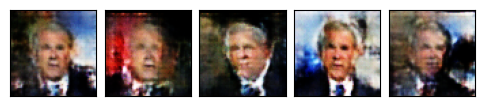

--- EPOCH 61/100 ---
100%|██████████| 34/34 [00:02<00:00, 14.26it/s]
Discriminator loss: 0.289782601134742
Generator loss:     5.018224789815791


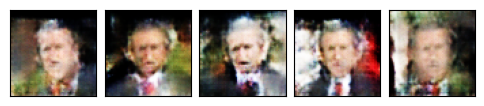

--- EPOCH 62/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.98it/s]
Discriminator loss: 0.24644258662181742
Generator loss:     4.272354182075052


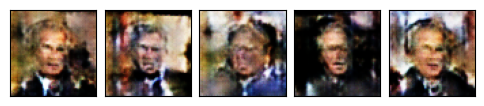

--- EPOCH 63/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.22it/s]
Discriminator loss: 0.3250175477827297
Generator loss:     5.094461777630975


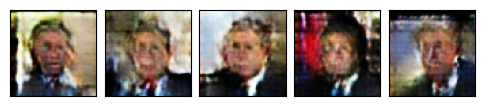

--- EPOCH 64/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.57it/s]
Discriminator loss: 0.17802470549941063
Generator loss:     4.630583426531623


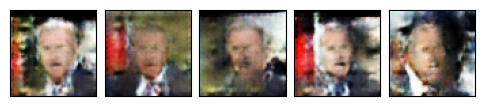

--- EPOCH 65/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.89it/s]
Discriminator loss: 0.3316124703954248
Generator loss:     5.285481509040384


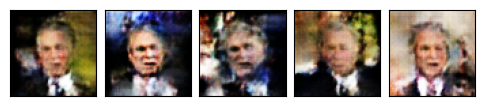

--- EPOCH 66/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.54it/s]
Discriminator loss: 0.229442522258443
Generator loss:     4.646529962034786


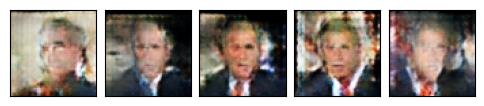

--- EPOCH 67/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.58it/s]
Discriminator loss: 0.2654567163108903
Generator loss:     5.034654207089368


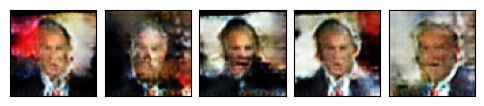

--- EPOCH 68/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.85it/s]
Discriminator loss: 0.2546722890042207
Generator loss:     5.444313287734985


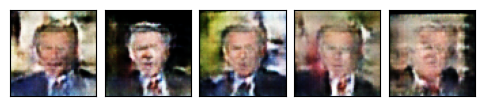

--- EPOCH 69/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.09it/s]
Discriminator loss: 0.45833161144572143
Generator loss:     5.429850284119739


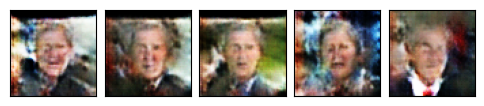

--- EPOCH 70/100 ---
100%|██████████| 34/34 [00:03<00:00, 11.01it/s]
Discriminator loss: 0.9640530303997152
Generator loss:     5.057475195211523


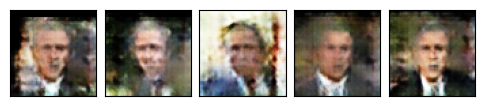

--- EPOCH 71/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.91it/s]
Discriminator loss: 0.327840702224742
Generator loss:     4.058323656811433


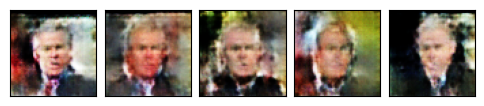

--- EPOCH 72/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.33it/s]
Discriminator loss: 0.21104199209195726
Generator loss:     4.24651111574734


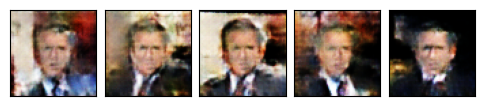

--- EPOCH 73/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.56it/s]
Discriminator loss: 0.17604513285572038
Generator loss:     4.084019126260982


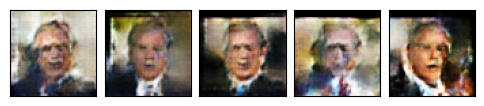

--- EPOCH 74/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.09it/s]
Discriminator loss: 0.3660503177191405
Generator loss:     4.817220355000566


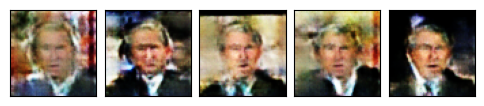

--- EPOCH 75/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.58it/s]
Discriminator loss: 0.45443129408008914
Generator loss:     4.699867543052225


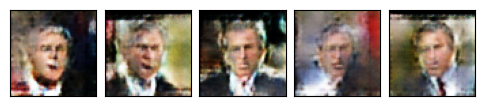

--- EPOCH 76/100 ---
100%|██████████| 34/34 [00:03<00:00, 11.12it/s]
Discriminator loss: 0.24785732225898435
Generator loss:     4.651897104347453


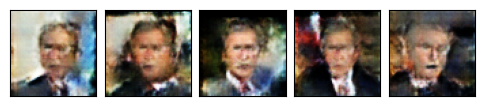

--- EPOCH 77/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.31it/s]
Discriminator loss: 0.19907678685644092
Generator loss:     4.4964130906497735


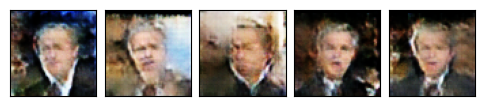

--- EPOCH 78/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.26it/s]
Discriminator loss: 0.19632584826253793
Generator loss:     4.812688602244153


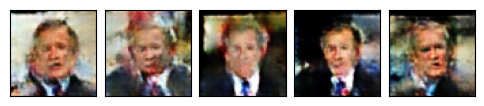

--- EPOCH 79/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.48it/s]
Discriminator loss: 0.29149450230247836
Generator loss:     4.944088449372964


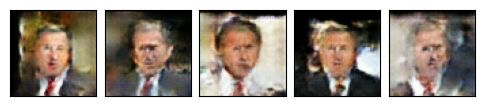

--- EPOCH 80/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.49it/s]
Discriminator loss: 0.41274585125639157
Generator loss:     4.662527056301341


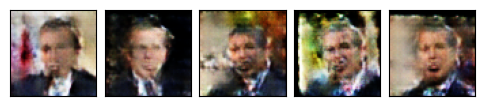

--- EPOCH 81/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.41it/s]
Discriminator loss: 0.16069684243377516
Generator loss:     4.790243345148423


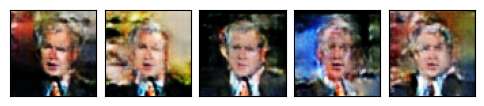

--- EPOCH 82/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.13it/s]
Discriminator loss: 0.1649554853930193
Generator loss:     4.79520034088808


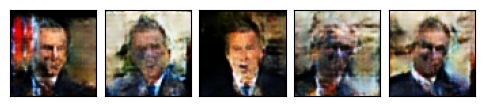

--- EPOCH 83/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.57it/s]
Discriminator loss: 0.17940115446553512
Generator loss:     4.903481788495007


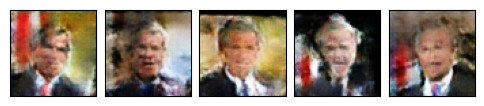

--- EPOCH 84/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.20it/s]
Discriminator loss: 0.2588127770406358
Generator loss:     5.436850730110617


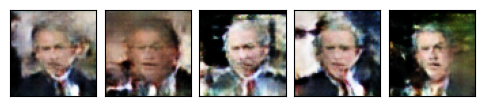

--- EPOCH 85/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.12it/s]
Discriminator loss: 0.22401043433038628
Generator loss:     5.156137101790485


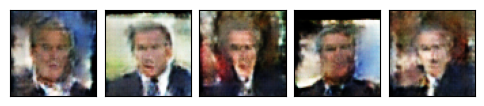

--- EPOCH 86/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.44it/s]
Discriminator loss: 0.21107211352928595
Generator loss:     4.887260408962474


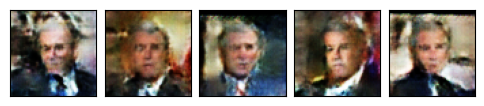

--- EPOCH 87/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.42it/s]
Discriminator loss: 0.3180593092213659
Generator loss:     5.288398826823515


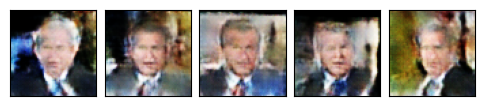

--- EPOCH 88/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.18it/s]
Discriminator loss: 0.33650694513583884
Generator loss:     5.08602950809633


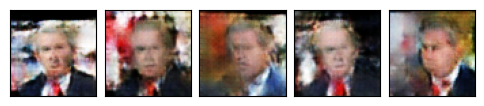

--- EPOCH 89/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.16it/s]
Discriminator loss: 0.5003504214041373
Generator loss:     5.179878603009617


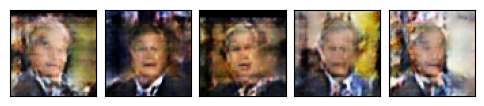

--- EPOCH 90/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.32it/s]
Discriminator loss: 0.22266743145883083
Generator loss:     4.698689937591553


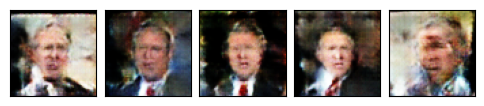

--- EPOCH 91/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.16it/s]
Discriminator loss: 0.1927965978050933
Generator loss:     4.868897445061627


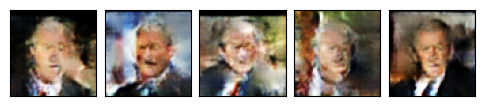

--- EPOCH 92/100 ---
100%|██████████| 34/34 [00:02<00:00, 11.40it/s]
Discriminator loss: 0.12129664032117408
Generator loss:     4.582510885070352


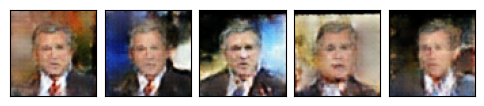

--- EPOCH 93/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.29it/s]
Discriminator loss: 0.11009939053260229
Generator loss:     4.707562110003303


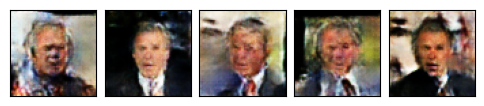

--- EPOCH 94/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.26it/s]
Discriminator loss: 0.1883353725733126
Generator loss:     5.210567789919236


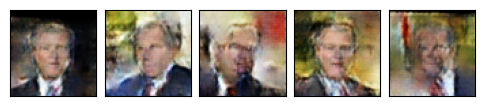

--- EPOCH 95/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.04it/s]
Discriminator loss: 0.12689705987406127
Generator loss:     5.494522150825052


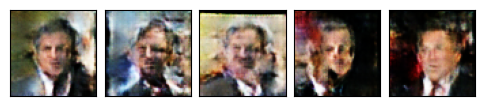

--- EPOCH 96/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.03it/s]
Discriminator loss: 0.18786701198448152
Generator loss:     5.388699440395131


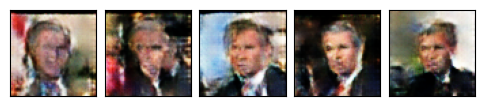

--- EPOCH 97/100 ---
100%|██████████| 34/34 [00:03<00:00, 11.10it/s]
Discriminator loss: 0.26035472411004934
Generator loss:     5.376026619883144


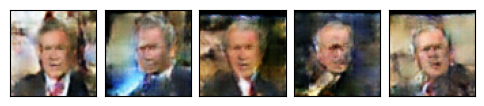

--- EPOCH 98/100 ---
100%|██████████| 34/34 [00:02<00:00, 12.66it/s]
Discriminator loss: 0.24016048063469284
Generator loss:     5.420409391908085


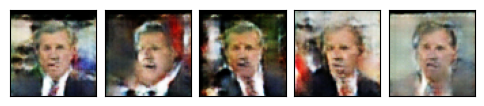

--- EPOCH 99/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.35it/s]
Discriminator loss: 0.4147685837438878
Generator loss:     5.644648636088652


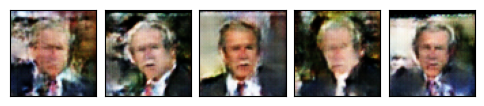

--- EPOCH 100/100 ---
100%|██████████| 34/34 [00:02<00:00, 13.45it/s]
Discriminator loss: 0.42709095031023026
Generator loss:     5.4288089976591225


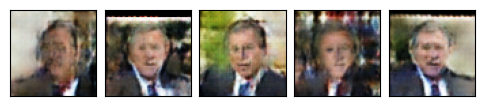

In [26]:
import IPython.display
import tqdm
from hw3.gan import train_batch

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

for epoch_idx in range(num_epochs):
    # We'll accumulate batch losses and show an average once per epoch.
    dsc_losses = []
    gen_losses = []
    print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

    with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
        for batch_idx, (x_data, _) in enumerate(dl_train):
            x_data = x_data.to(device)
            dsc_loss, gen_loss = train_batch(
                dsc, gen,
                dsc_loss_fn, gen_loss_fn,
                dsc_optimizer, gen_optimizer,
                x_data)
            dsc_losses.append(dsc_loss)
            gen_losses.append(gen_loss)
            pbar.update()

    dsc_avg_loss, gen_avg_loss = np.mean(dsc_losses), np.mean(gen_losses)
    print(f'Discriminator loss: {dsc_avg_loss}')
    print(f'Generator loss:     {gen_avg_loss}')

    samples = gen.sample(5, with_grad=False)
    fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
    IPython.display.display(fig)
    plt.close(fig)


*** Images Generated from best model:


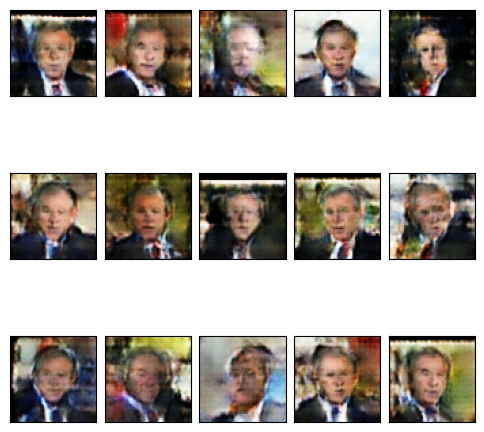

In [27]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [28]:
from helpers.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [29]:
display_answer(hw3.answers.part3_q1)



We have two loss functions, one for the generator and one for the discriminator.
We want to train the discriminator to distinguish between real and fake images, and we want to train the generator to
fool the discriminator by generating images that are more similar to the real images.
We want to maximize the discriminator's loss function and minimize the generator's loss function.

When we train the discriminator, we don't want to update the generator's weights because it will make the generator
worse at fooling the discriminator, so we discard the gradients.
When we train the generator, we want to maintain the gradients of its loss function so the generator will get better at
fooling the discriminator. 




### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [30]:
display_answer(hw3.answers.part3_q2)




1. When training a GAN to generate images, we should not decide to stop training only based on the fact that the 
Generator loss is below some threshold.
The reason is that the Generator loss is not a good indicator of the quality of the generated images.
The Generator loss is a measure of how well the Generator is able to fool the Discriminator, but it does not measure how
 well the Generator is able to generate images that look like real images.
For example, the Generator can generate images that look like real images, but they are all the same image or just a
 small set of images, so the Generator loss will be low, but the images will not be good, as we saw in class.
In addition, the Generator loss can be low because the Discriminator is not good at distinguishing between real and fake
images. And thus we need to look at the Discriminator loss too.

2. It means that the Generator is getting better at fooling the Discriminator (by generating images that look like
real images), but the Discriminator is not getting better at distinguishing between real and fake images.

This can happen if the Discriminator is not good enough to begin with, or if the Generator is getting better at
fooling the Discriminator in a way that the Discriminator cannot learn to distinguish between real and fake images.
    



### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [31]:
display_answer(hw3.answers.part3_q3)



The results we got when generating images with the VAE are blurry, and the results we got when generating images with 
the GAN are sharp.
The main difference is that the VAE is trained to reconstruct the input images and to keep the latent space prior
distribution close to the standard normal distribution using a small latent space, which means that the images will be
blurry. The GAN is trained to generate images that are similar to the real images, and thus blurry images are not
good enough, so as the loss decreases, the images become sharper.

